# Title : "Optimizing Supply Chain Management for Instant Noodles Delivery:

A Machine Learning Approach to Tackle Supply Chain Disruptions"

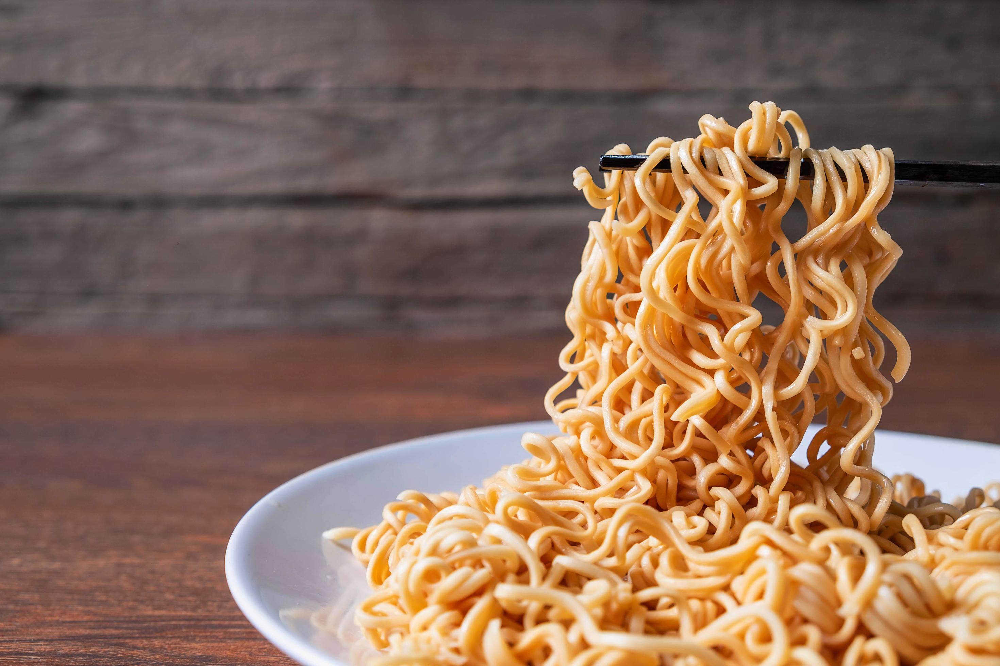

## Intro - Business Problem Statement :

In the fast-moving consumer goods (FMCG) industry, an instant noodles company faces a critical challenge - a mismatch between demand and supply. High-demand areas experience low supply, while low-demand areas have excessive inventory, resulting in cost losses. To optimize warehouse stock levels and tackle supply chain disruptions, we propose a data-driven machine learning solution. By finding the ideal quantity of instant noodles to ship to each warehouse, we can minimize costs and seize growth opportunities. Join us on this journey to unlock the potential of supply chain management in the instant noodles business.







# Goal & Objective:
Our aim is to develop a data-driven model using historical data to optimize instant noodles supply chain management. The model will determine the ideal product shipment weight for each warehouse, reducing costs and improving efficiency. Additionally, we will analyze demand patterns in different regions to drive targeted advertisement campaigns. This project's success will lead to a more comprehensive data exploration phase, enabling the creation of a robust and effective supply chain management model.

# Data Dictionary" or "Key Fields Description :
Here is a summary of the key fields in the dataset:

| Field Name             | Description                                            |
|------------------------|--------------------------------------------------------|
| Warehouse_id           | Unique identifier for each product warehouse.         |
| WH_Manager_ID          | Employee ID of the warehouse manager.                 |
| Location_type          | Categorization of warehouse location (city or village).|
| WH_capacity_size       | Storage capacity of the warehouse.                    |
| Zone                   | Geographical zone of the warehouse.                   |
| WH_regional_zone       | Regional zone of the warehouse under each zone.       |
| num_refill_req_l3m     | Number of times refilling requested in the last 3 months.|
| transport_issue_l1y    | Indicator of any transport issues reported in the last year.|
| Competitor_in_mkt      | Number of instant noodles competitors in the market.  |
| retail_shop_num        | Number of retail shops selling the product under the warehouse area.|
| wh_owner_type          | Ownership type of the warehouse (company-owned or rented).|
| distributor_num        | Number of distributors working between the warehouse and retail shops.|
| flood_impacted         | Indicator if the warehouse is located in a flood-impacted area.|
| Flood_proof            | Indicator if the warehouse is flood-proof.             |
| electric_supply        | Indicator if the warehouse has electric backup (generator) for load shedding.|
| dist_from_hub          | Distance between the warehouse and the production hub (in kms).|
| workers_num            | Number of workers in the warehouse.                   |
| wh_est_year            | Year of warehouse establishment.                      |
| storage_issue_reported_l3m | Indicator of any storage issues reported in the last 3 months.|
| temp_reg_mach          | Indicator whether the warehouse has temperature regulating machines.|
| approved_wh_govt_certificate | Type of government certificate issued to the warehouse.|
| wh_breakdown_l3m       | Number of times the warehouse faced a breakdown in the last 3 months.|
| govt_check_l3m         | Number of times government officers visited the warehouse to check stored food quality.|
| product_wg_ton (Target_column) | Weight of the product (in tons) shipped in the last 3 months.|

This data dictionary provides essential information about each field in the dataset, helping you understand the dataset's structure and the role of each variable in the analysis.


# Summary :

Our project aims to optimize instant noodles supply chain management in the FMCG industry. We will develop a data-driven regression model using historical data to predict ideal product shipment weights for each warehouse. By minimizing costs and improving efficiency, we seek to tackle demand-supply mismatches and enhance overall performance. Join us on this journey to redefine supply chain success with data-driven insights.


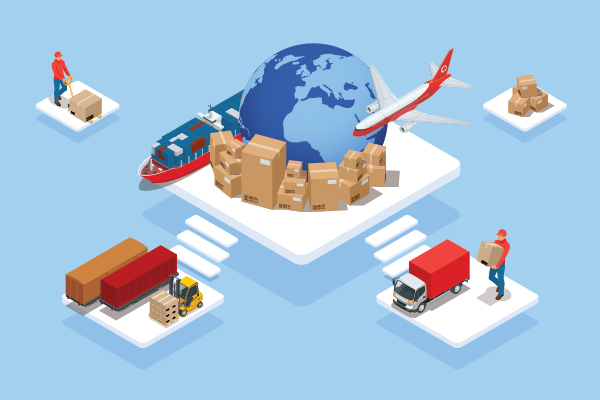

# Importing and Loading Dataset:



In [57]:
# import Necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error
from sklearn.preprocessing import MinMaxScaler

In [58]:
# Load the dataset

df = pd.read_csv("/content/Data.csv")
df.head()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,...,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,...,1,91,29.0,NaN,13,0,A,5,15,17115
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,...,1,210,31.0,NaN,4,0,A,3,17,5074
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,...,0,161,37.0,NaN,17,0,A,6,22,23137
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,...,0,103,21.0,NaN,17,1,A+,3,27,22115
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,...,1,112,25.0,2009.0,18,0,C,6,24,24071


In [59]:
# Check the shape of data

df.shape

(25000, 24)

In [60]:
# Check no of columns

df.columns

Index(['Ware_house_ID', 'WH_Manager_ID', 'Location_type', 'WH_capacity_size',
       'zone', 'WH_regional_zone', 'num_refill_req_l3m', 'transport_issue_l1y',
       'Competitor_in_mkt', 'retail_shop_num', 'wh_owner_type',
       'distributor_num', 'flood_impacted', 'flood_proof', 'electric_supply',
       'dist_from_hub', 'workers_num', 'wh_est_year',
       'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m',
       'product_wg_ton'],
      dtype='object')

In [61]:
#   Display information about data

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ware_house_ID                 25000 non-null  object 
 1   WH_Manager_ID                 25000 non-null  object 
 2   Location_type                 25000 non-null  object 
 3   WH_capacity_size              25000 non-null  object 
 4   zone                          25000 non-null  object 
 5   WH_regional_zone              25000 non-null  object 
 6   num_refill_req_l3m            25000 non-null  int64  
 7   transport_issue_l1y           25000 non-null  int64  
 8   Competitor_in_mkt             25000 non-null  int64  
 9   retail_shop_num               25000 non-null  int64  
 10  wh_owner_type                 25000 non-null  object 
 11  distributor_num               25000 non-null  int64  
 12  flood_impacted                25000 non-null  int64  
 13  f

In [62]:
# Statistical discription about the data

df.describe()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
count,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,24010.000000,13119.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000
mean,4.089040,0.773680,3.104200,4985.711560,42.418120,0.098160,0.054640,0.656880,163.537320,28.944398,2009.383185,17.130440,0.303280,3.482040,18.812280,22102.632920
std,2.606612,1.199449,1.141663,1052.825252,16.064329,0.297537,0.227281,0.474761,62.718609,7.872534,7.528230,9.161108,0.459684,1.690335,8.632382,11607.755077
min,0.000000,0.000000,0.000000,1821.000000,15.000000,0.000000,0.000000,0.000000,55.000000,10.000000,1996.000000,0.000000,0.000000,0.000000,1.000000,2065.000000
25%,2.000000,0.000000,2.000000,4313.000000,29.000000,0.000000,0.000000,0.000000,109.000000,24.000000,2003.000000,10.000000,0.000000,2.000000,11.000000,13059.000000
50%,4.000000,0.000000,3.000000,4859.000000,42.000000,0.000000,0.000000,1.000000,164.000000,28.000000,2009.000000,18.000000,0.000000,3.000000,21.000000,22101.000000
75%,6.000000,1.000000,4.000000,5500.000000,56.000000,0.000000,0.000000,1.000000,218.000000,33.000000,2016.000000,24.000000,1.000000,5.000000,26.000000,30103.000000
max,8.000000,5.000000,12.000000,11008.000000,70.000000,1.000000,1.000000,1.000000,271.000000,98.000000,2023.000000,39.000000,1.000000,6.000000,32.000000,55151.000000


In [63]:
# Check datatypes

df.dtypes

Ware_house_ID                    object
WH_Manager_ID                    object
Location_type                    object
WH_capacity_size                 object
zone                             object
WH_regional_zone                 object
num_refill_req_l3m                int64
transport_issue_l1y               int64
Competitor_in_mkt                 int64
retail_shop_num                   int64
wh_owner_type                    object
distributor_num                   int64
flood_impacted                    int64
flood_proof                       int64
electric_supply                   int64
dist_from_hub                     int64
workers_num                     float64
wh_est_year                     float64
storage_issue_reported_l3m        int64
temp_reg_mach                     int64
approved_wh_govt_certificate     object
wh_breakdown_l3m                  int64
govt_check_l3m                    int64
product_wg_ton                    int64
dtype: object

In [64]:
# Check is there any duplicated rows

df.duplicated().sum()

0

In [65]:
# Check for missing values in the dataset

df.isnull().sum()

Ware_house_ID                       0
WH_Manager_ID                       0
Location_type                       0
WH_capacity_size                    0
zone                                0
WH_regional_zone                    0
num_refill_req_l3m                  0
transport_issue_l1y                 0
Competitor_in_mkt                   0
retail_shop_num                     0
wh_owner_type                       0
distributor_num                     0
flood_impacted                      0
flood_proof                         0
electric_supply                     0
dist_from_hub                       0
workers_num                       990
wh_est_year                     11881
storage_issue_reported_l3m          0
temp_reg_mach                       0
approved_wh_govt_certificate      908
wh_breakdown_l3m                    0
govt_check_l3m                      0
product_wg_ton                      0
dtype: int64

###### 3 columns contains missing values such as workers_num,wh_est_year,approved_wh_govt_certificate

# Missing Value Imputation

In [66]:
# impute the missing values in 'Workers_num' with the mean

df['workers_num'].fillna(df['workers_num'].mean(),inplace=True)

In [67]:
# Impute missing values in 'aprroved_wh_govt_certificate' with the mode

df['approved_wh_govt_certificate'].fillna(df['approved_wh_govt_certificate'].mode()[0],inplace=True)


In [68]:
df.isnull().sum()

Ware_house_ID                       0
WH_Manager_ID                       0
Location_type                       0
WH_capacity_size                    0
zone                                0
WH_regional_zone                    0
num_refill_req_l3m                  0
transport_issue_l1y                 0
Competitor_in_mkt                   0
retail_shop_num                     0
wh_owner_type                       0
distributor_num                     0
flood_impacted                      0
flood_proof                         0
electric_supply                     0
dist_from_hub                       0
workers_num                         0
wh_est_year                     11881
storage_issue_reported_l3m          0
temp_reg_mach                       0
approved_wh_govt_certificate        0
wh_breakdown_l3m                    0
govt_check_l3m                      0
product_wg_ton                      0
dtype: int64

In [69]:
# Drop 'wh_est_year' column due to a large number of missing values

df.drop(columns=['wh_est_year'], inplace=True)
df.dropna(axis=0)


,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,...,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,...,1,1,91,29.000000,13,0,A,5,15,17115
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,...,0,1,210,31.000000,4,0,A,3,17,5074
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,...,0,0,161,37.000000,17,0,A,6,22,23137
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,...,0,0,103,21.000000,17,1,A+,3,27,22115
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,...,0,1,112,25.000000,18,0,C,6,24,24071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,WH_124995,EID_74995,Rural,Small,North,Zone 1,3,0,4,5390,...,0,1,142,34.000000,22,1,A,2,30,32093
24996,WH_124996,EID_74996,Rural,Mid,West,Zone 2,6,0,4,4490,...,0,1,130,28.000000,10,0,B,4,18,12114
24997,WH_124997,EID_74997,Urban,Large,South,Zone 5,7,0,2,5403,...,0,1,147,28.944398,23,0,B+,5,25,27080
24998,WH_124998,EID_74998,Rural,Small,North,Zone 1,1,0,2,10562,...,0,1,60,25.000000,18,0,A,6,30,25093


In [70]:
# Assuming 'Ware_house_ID' and 'WH_Manager_ID' are identifiers and not useful for modeling, we can drop them

df.drop(columns=['Ware_house_ID','WH_Manager_ID'],inplace=True)

In [71]:
df.columns

Index(['Location_type', 'WH_capacity_size', 'zone', 'WH_regional_zone',
       'num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt',
       'retail_shop_num', 'wh_owner_type', 'distributor_num', 'flood_impacted',
       'flood_proof', 'electric_supply', 'dist_from_hub', 'workers_num',
       'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m',
       'product_wg_ton'],
      dtype='object')

In [76]:
# Checking Categorical columns

categorical_columns=[column for column in df.columns if df[column].dtype=='object']

In [77]:
categorical_columns

['Location_type',
 'WH_capacity_size',
 'zone',
 'WH_regional_zone',
 'wh_owner_type',
 'approved_wh_govt_certificate']

In [79]:
# Perform one-hot encoding for categorical variables

categorical_cols = ['Location_type', 'WH_capacity_size', 'zone', 'WH_regional_zone', 'wh_owner_type', 'approved_wh_govt_certificate']

df_encoded = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

In [81]:
# Check the shape of encoded columns

print("Encoded DataFrame Shape:")
df_encoded.shape

Encoded DataFrame Shape:


(25000, 31)

In [82]:
df_encoded.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,...,WH_regional_zone_Zone 2,WH_regional_zone_Zone 3,WH_regional_zone_Zone 4,WH_regional_zone_Zone 5,WH_regional_zone_Zone 6,wh_owner_type_Rented,approved_wh_govt_certificate_A+,approved_wh_govt_certificate_B,approved_wh_govt_certificate_B+,approved_wh_govt_certificate_C
0,3,1,2,4651,24,0,1,1,91,29.0,...,0,0,0,0,1,1,0,0,0,0
1,0,0,4,6217,47,0,0,1,210,31.0,...,0,0,0,1,0,0,0,0,0,0
2,1,0,4,4306,64,0,0,0,161,37.0,...,1,0,0,0,0,0,0,0,0,0
3,7,4,2,6000,50,0,0,0,103,21.0,...,0,1,0,0,0,1,1,0,0,0
4,3,1,2,4740,42,1,0,1,112,25.0,...,0,0,0,1,0,0,0,0,0,1


In [83]:
# Count of Outliers

q1 =df.quantile(0.25)
q3 =df.quantile(0.75)
IQR = q3-q1
outliers = pd.DataFrame(((df > (q3+1.5*IQR)) | (df < (q1-IQR*1.5))).sum(axis=0),columns=['No.of outliers'])
outliers['Percentage of outliers'] = round(outliers['No.of outliers']*100/len(df),2)
outliers


<ipython-input-83-9f9d88c531d9>:3: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  q1 =df.quantile(0.25)
<ipython-input-83-9f9d88c531d9>:4: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  q3 =df.quantile(0.75)
<ipython-input-83-9f9d88c531d9>:6: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  outliers = pd.DataFrame(((df > (q3+1.5*IQR)) | (df < (q1-IQR*1.5))).sum(axis=0),columns=['No.of outliers'])


,No.of outliers,Percentage of outliers
Competitor_in_mkt,96,0.38
Location_type,0,0.00
WH_capacity_size,0,0.00
WH_regional_zone,0,0.00
approved_wh_govt_certificate,0,0.00
dist_from_hub,0,0.00
distributor_num,0,0.00
electric_supply,0,0.00
flood_impacted,2454,9.82
flood_proof,1366,5.46


# EXPLORATORY DATA ANALYSIS

In [84]:
pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.3/356.3 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 33.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 31.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 53.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27079 sha256=572449a6121160a504e21990575a97f821dd12af38e40ffc86c04f3586946237
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordcloud-1.8.2.2:
      Successfully uninstalled wordcloud-1.8.2.2


In [86]:
# Import the necessary library for generating data profiling reports

from ydata_profiling import ProfileReport

In [87]:
# Create a data profiling report using the ProfileReport class

profile = ProfileReport(df,title="SUPPLY CHAIN MANGEMENT")

In [88]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Leveraging Pandas Profiling for Comprehensive Data Analysis:

Pandas Profiling is a powerful tool that facilitates in-depth data analysis. It empowers us to delve into our data, unlocking a plethora of valuable insights through a diverse range of charts and visualizations.

# Charting the Data Landscape:
With Pandas Profiling, we can effortlessly generate a variety of charts that showcase our data's distribution, patterns, and trends. These visual representations provide a clear and concise overview, aiding us in extracting meaningful information.

# A Window into Statistical Exploration:
Beyond visuals, Pandas Profiling equips us with statistical insights. By diving into descriptive statistics, correlations, and more, we gain a deeper understanding of our data's characteristics.

Incorporating Pandas Profiling into our analysis process enables us to harness the full potential of our data, making informed decisions for our business strategies.

In [89]:
# Installing Plotly and Importing chart_studio Module

!pip install plotly==3.10.0
from chart_studio import plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.5/41.5 MB 13.8 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.13.1
    Uninstalling plotly-5.13.1:
      Successfully uninstalled plotly-5.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cufflinks 0.17.3 requires plotly>=4.1.1, but you have plotly 3.10.0 which is incompatible.


In [90]:
# Initializing Plotly Notebook Mode and Importing Plotly Graph Objects

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [91]:
# word cloud library

from wordcloud import WordCloud

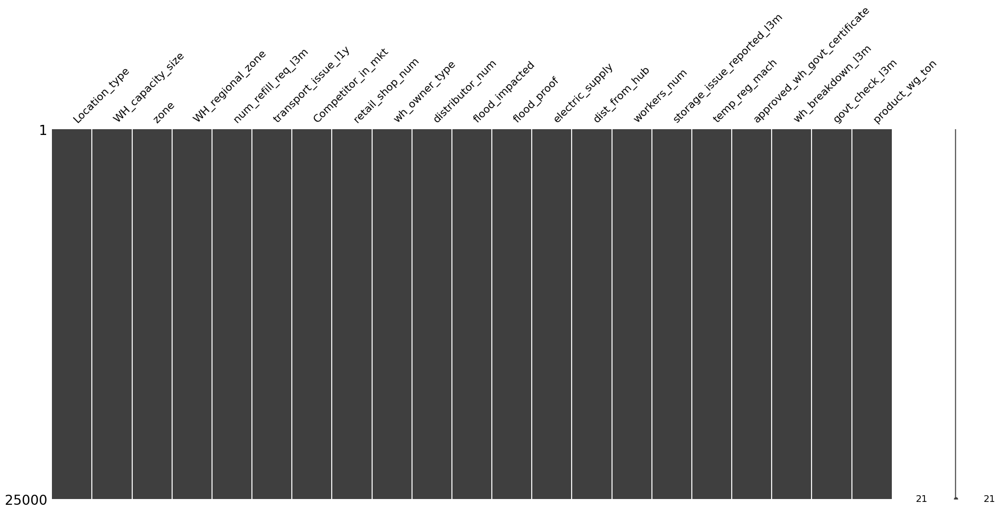

In [96]:
#import missing library and Visualizing Missing Data Distribution

import missingno as msno
msno.matrix(df)
plt.show()

The chart above is a reassuring testament to the meticulous data management, as it reveals the absence of any missing values within the dataset. This paves the way for a comprehensive and reliable analysis.

In [97]:
df.columns

Index(['Location_type', 'WH_capacity_size', 'zone', 'WH_regional_zone',
       'num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt',
       'retail_shop_num', 'wh_owner_type', 'distributor_num', 'flood_impacted',
       'flood_proof', 'electric_supply', 'dist_from_hub', 'workers_num',
       'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m',
       'product_wg_ton'],
      dtype='object')

In [98]:
categorical_columns

['Location_type',
 'WH_capacity_size',
 'zone',
 'WH_regional_zone',
 'wh_owner_type',
 'approved_wh_govt_certificate']

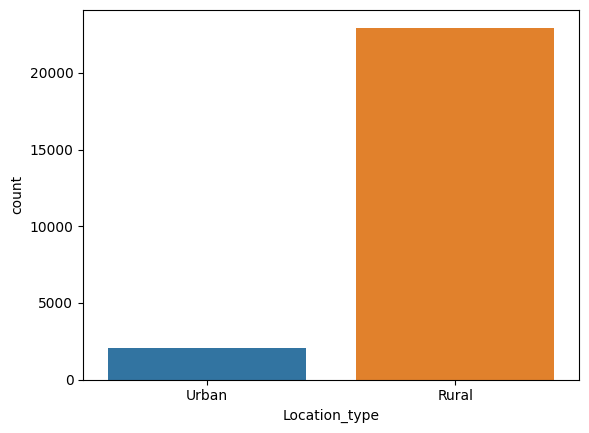

In [99]:
#Warehouse Distribution by Location Type

sns.countplot(x = 'Location_type',data = df)
plt.show()

Through an artistic visualization, the preceding graphic eloquently communicates that the majority of warehouses find their strategic foothold in the tranquil ambiance of rural areas. This strategic distribution underscores the optimal positioning for supply chain efficiency.

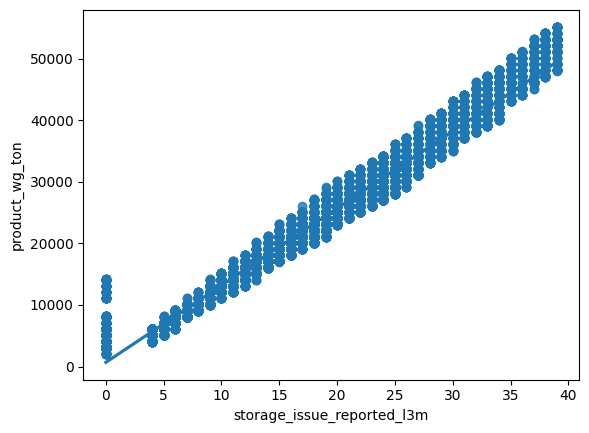

In [100]:
# Relationship between Storage Issue Reports and Product Weight

sns.regplot(x='storage_issue_reported_l3m',y='product_wg_ton',data=df)
plt.show()

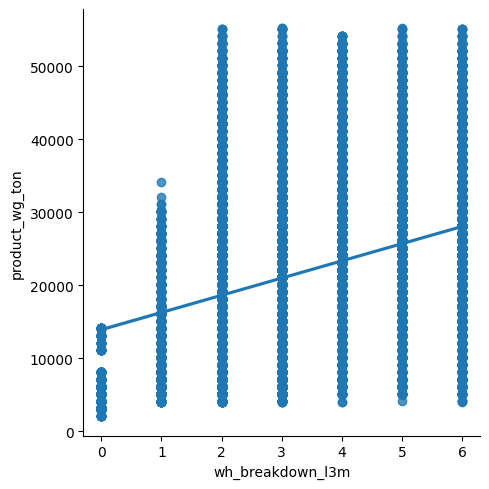

In [101]:
# Correlation between Warehouse Breakdowns and Product Weight

sns.lmplot(x='wh_breakdown_l3m',y='product_wg_ton',data=df)
plt.show()


<ipython-input-102-6ba6a4985a0c>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='retail_shop_num', ylabel='Density'>

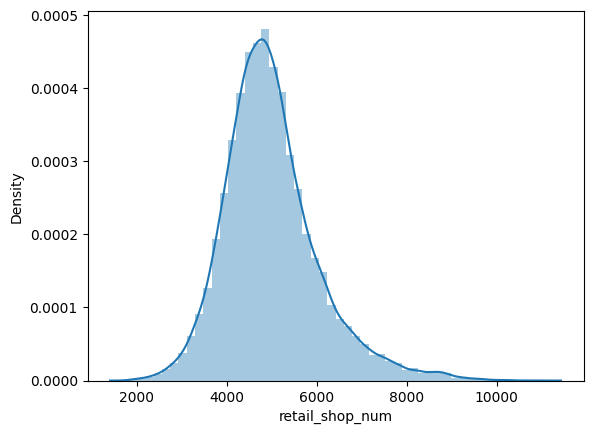

In [102]:
# Distribution of Retail Shop Numbers

sns.distplot(df['retail_shop_num'])

The enthralling plot above gracefully unfolds the normative distribution trend within the realm of retail shops. This illumination offers a fascinating angle to our exploration, shedding light on the typical patterns within this crucial segment of the supply chain puzzle.

<ipython-input-104-c1a7dacbe1f3>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='workers_num', ylabel='Density'>

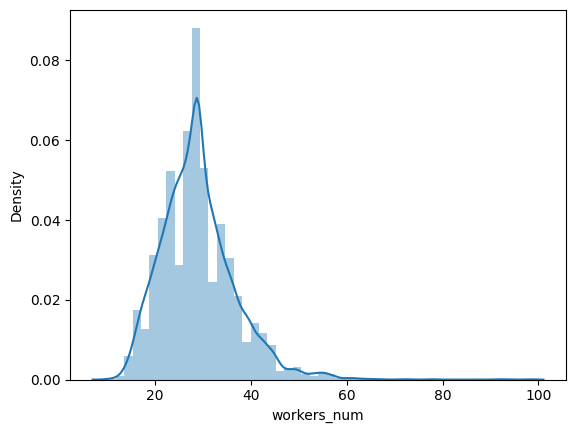

In [104]:
# Distribution of Workers' Numbers and Insights

sns.distplot(df['workers_num'])

The graph above provides an insightful view of the distribution of the number of workers across different data points. The distribution appears to follow a relatively normal pattern, shedding light on the typical workforce composition. This information can offer valuable insights into the operational dynamics and human resource requirements of the supply chain management process.

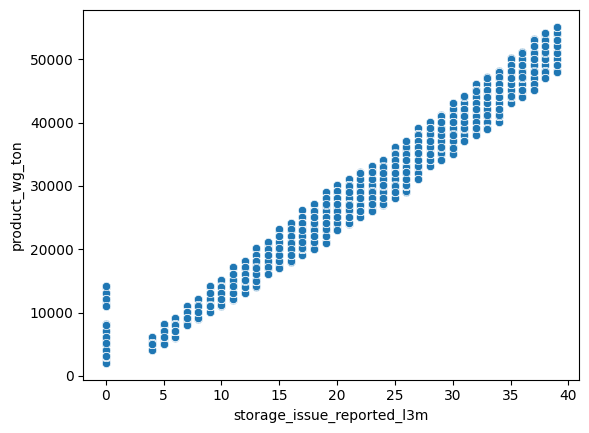

In [105]:
# Storage Issues vs Product Weight

sns.scatterplot(y ='product_wg_ton',x ='storage_issue_reported_l3m' ,data = df )
plt.show()

The scatterplot above reveals a strong positive correlation between the storage issues reported during the last 3 months and the quantity of products shipped within the same period.

<Axes: xlabel='WH_capacity_size', ylabel='count'>

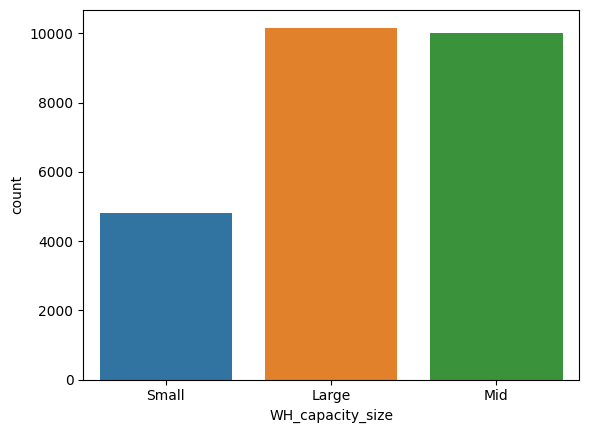

In [106]:
# Warehouse Capacity Distribution using count plot

sns.countplot(x = 'WH_capacity_size',data = df)

The count plot above provides insights into the distribution of warehouse capacity sizes. It reveals that medium-sized warehouses dominate the dataset, indicating that these capacity levels are more prevalent within the supply chain management system.

<Axes: xlabel='zone', ylabel='count'>

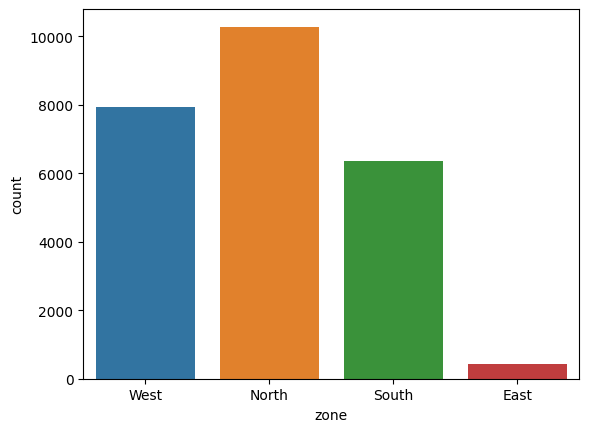

In [107]:
# Count Plot : Zone-wise Distribution of Warehouses

sns.countplot(x = 'zone',data = df)

Upon analyzing the count plot of warehouse distribution across different zones, it becomes evident that the majority of warehouses are strategically located in the North zone. This insight sheds light on the geographical distribution of warehouses and could be crucial for optimizing supply chain management and delivery operations in the respective zones.

<Axes: xlabel='WH_regional_zone', ylabel='count'>

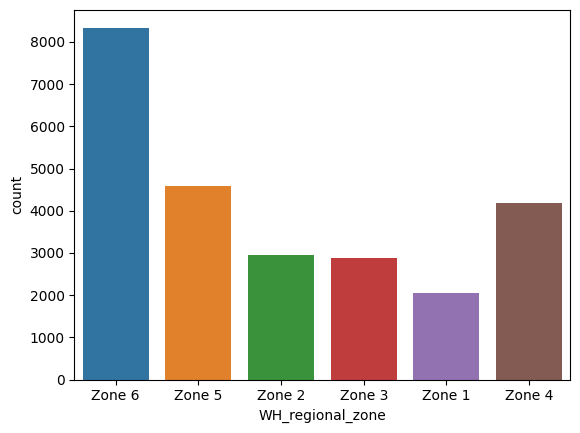

In [108]:
# Regional Zone Distribution of Warehouses

sns.countplot(x = 'WH_regional_zone',data = df)

The count plot above reveals a significant observation :                  the majority of warehouses are concentrated within Zone-6, indicating a notable preference for this particular regional zone.

<Axes: xlabel='wh_owner_type', ylabel='count'>

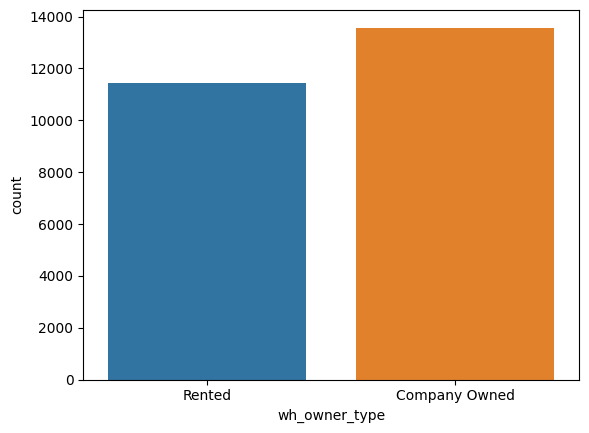

In [109]:
# Count of Warehouses by Ownership Type

sns.countplot(x = 'wh_owner_type',data = df)

The count plot above provides a valuable insight into the ownership distribution of warehouses. It is evident that the majority of warehouses in the dataset are company-owned, reflecting a significant presence of the company's infrastructure in the supply chain.

<Axes: xlabel='approved_wh_govt_certificate', ylabel='count'>

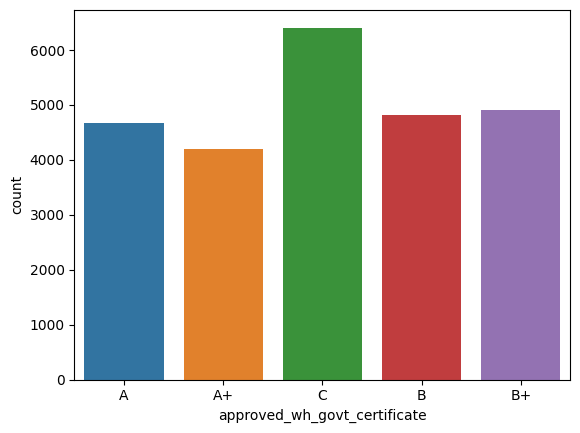

In [110]:
# Warehouse Government Certification Status Distribution Count Plot

sns.countplot(x = 'approved_wh_govt_certificate',data = df)

The count plot above provides insights into the distribution of government-approved warehouse certificates. Notably, the majority of the certificates fall under the 'C' type category.

<ipython-input-111-b7555e615555>:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



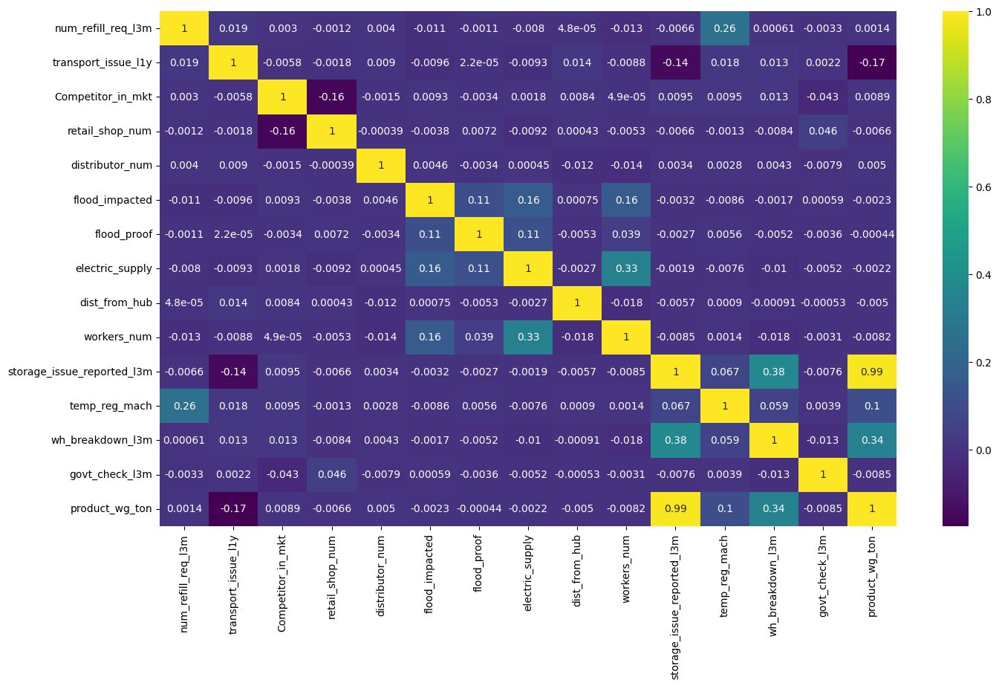

In [111]:
# Correlation Heatmap of Dataset Variables

plt.figure(figsize=(16,9))

ax = sns.heatmap(df.corr(),annot = True,cmap = 'viridis')
plt.show()

Correlation analysis plays a vital role in understanding the significant features that impact the target variable. From the heatmap above, it is evident that the storage issues reported during the last three months have a substantial impact on the sales shipments. This insight underscores the importance of addressing and optimizing storage management for enhancing overall sales performance.

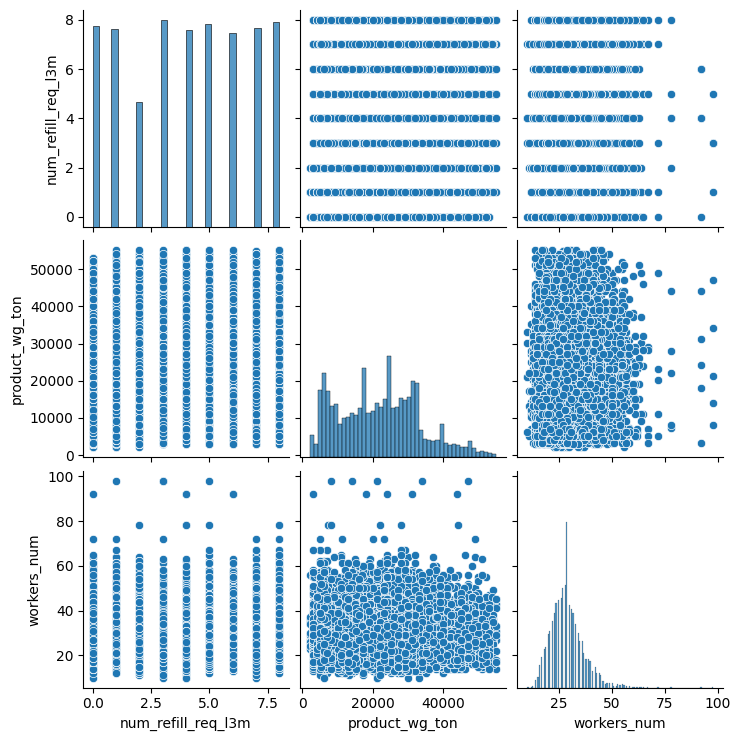

In [112]:
# Pair plot to visualize relationships between multiple variables

sns.pairplot(df, vars=['num_refill_req_l3m', 'product_wg_ton', 'workers_num'])
plt.show()

The pair plot above offers a visual glimpse into the relationships between multiple variables simultaneously. Through this multivariate analysis, we can observe how 'num_refill_req_l3m', 'product_wg_ton', and 'workers_num' interact with one another. This visualization aids us in understanding potential correlations and patterns among these variables.

# Spliting Data into Train and Test

In [119]:
# Separate the target variable (total_sales) from the features

x =df_encoded.drop(columns=['product_wg_ton'])
y= df_encoded['product_wg_ton']

In [120]:
# Split the data into training and testing sets

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

In [121]:
# Scaling the values to convert the int values to Machine Languages

from sklearn.preprocessing import MinMaxScaler
mmscaler=MinMaxScaler(feature_range=(0,1))
x_train=mmscaler.fit_transform(x_train)
x_test=mmscaler.fit_transform(x_test)
x_train=pd.DataFrame(x_train)
x_test=pd.DataFrame(x_test)

In [122]:
# Creating a Placeholder DataFrame for Model Evaluation Results

a={'Model Name':[], 'Mean_Absolute_Error_MAE':[] ,'Adj_R_Square':[] ,'Root_Mean_Squared_Error_RMSE':[] ,'Mean_Absolute_Percentage_Error_MAPE':[] ,'Mean_Squared_Error_MSE':[] ,'Root_Mean_Squared_Log_Error_RMSLE':[] ,'R2_score':[]}
Results=pd.DataFrame(a)
Results.head()

,Model Name,Mean_Absolute_Error_MAE,Adj_R_Square,Root_Mean_Squared_Error_RMSE,Mean_Absolute_Percentage_Error_MAPE,Mean_Squared_Error_MSE,Root_Mean_Squared_Log_Error_RMSLE,R2_score


In [123]:
# Build the Regression / Regressor models

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn import linear_model
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [124]:
# Create objects of Regression / Regressor models with default hyper-parameters

modelmlg = LinearRegression()
modeldcr = DecisionTreeRegressor()
modelbag = BaggingRegressor()
modelrfr = RandomForestRegressor()
modelSVR = SVR()
modelXGR = xgb.XGBRegressor()
modelKNN = KNeighborsRegressor(n_neighbors=5)
modelETR = ExtraTreesRegressor()
modelRE=Ridge()
modelLO=linear_model.Lasso(alpha=0.1)

modelGBR = GradientBoostingRegressor(loss='squared_error', learning_rate=0.1, n_estimators=100, subsample=1.0,
                                     criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1,
                                     min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0,
                                     init=None, random_state=None, max_features=None,
                                     alpha=0.9, verbose=0, max_leaf_nodes=None, warm_start=False,
                                     validation_fraction=0.1, n_iter_no_change=None, tol=0.0001, ccp_alpha=0.0)

# Evalution matrix for all the algorithms

MM = [modelmlg, modeldcr, modelrfr, modelKNN, modelETR, modelGBR, modelXGR, modelbag,modelRE,modelLO]

for models in MM:

    # Fit the model with train data

    models.fit(x_train, y_train)

    # Predict the model with test data

    y_pred = models.predict(x_test)

    # Print the model name

    print('Model Name: ', models)

    # Evaluation metrics for Regression analysis

    from sklearn import metrics

    print('Mean Absolute Error (MAE):', round(metrics.mean_absolute_error(y_test, y_pred),3))
    print('Mean Squared Error (MSE):', round(metrics.mean_squared_error(y_test, y_pred),3))
    print('Root Mean Squared Error (RMSE):', round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)),3))
    print('R2_score:', round(metrics.r2_score(y_test, y_pred),6))
    print('Root Mean Squared Log Error (RMSLE):', round(np.log(np.sqrt(metrics.mean_squared_error(y_test, y_pred))),3))

    # Define the function to calculate the MAPE - Mean Absolute Percentage Error

    def MAPE (y_test, y_pred):
        y_test, y_pred = np.array(y_test), np.array(y_pred)
        return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

    # Evaluation of MAPE

    result = MAPE(y_test, y_pred)
    print('Mean Absolute Percentage Error (MAPE):', round(result, 2), '%')

    # Calculate Adjusted R squared values

    r_squared = round(metrics.r2_score(y_test, y_pred),6)
    adjusted_r_squared = round(1 - (1-r_squared)*(len(y)-1)/(len(y)-x.shape[1]-1),6)
    print('Adj R Square: ', adjusted_r_squared)
    print('------------------------------------------------------------------------------------------------------------')
    #-------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'Mean_Absolute_Error_MAE' : metrics.mean_absolute_error(y_test, y_pred),
               'Adj_R_Square' : adjusted_r_squared,
               'Root_Mean_Squared_Error_RMSE' : np.sqrt(metrics.mean_squared_error(y_test, y_pred)),
               'Mean_Absolute_Percentage_Error_MAPE' : result,
               'Mean_Squared_Error_MSE' : metrics.mean_squared_error(y_test, y_pred),
               'Root_Mean_Squared_Log_Error_RMSLE': np.log(np.sqrt(metrics.mean_squared_error(y_test, y_pred))),
               'R2_score' : metrics.r2_score(y_test, y_pred)}
    Results = Results.append(new_row, ignore_index=True)

Model Name:  LinearRegression()
Mean Absolute Error (MAE): 998.823
Mean Squared Error (MSE): 1849385.109
Root Mean Squared Error (RMSE): 1359.921
R2_score: 0.986537
Root Mean Squared Log Error (RMSLE): 7.215
Mean Absolute Percentage Error (MAPE): 7.28 %
Adj R Square:  0.986521
------------------------------------------------------------------------------------------------------------


<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Model Name:  DecisionTreeRegressor()
Mean Absolute Error (MAE): 869.754
Mean Squared Error (MSE): 1679396.832
Root Mean Squared Error (RMSE): 1295.915
R2_score: 0.987775
Root Mean Squared Log Error (RMSLE): 7.167
Mean Absolute Percentage Error (MAPE): 5.43 %
Adj R Square:  0.98776
------------------------------------------------------------------------------------------------------------


<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Model Name:  RandomForestRegressor()
Mean Absolute Error (MAE): 703.336
Mean Squared Error (MSE): 894157.92
Root Mean Squared Error (RMSE): 945.599
R2_score: 0.993491
Root Mean Squared Log Error (RMSLE): 6.852
Mean Absolute Percentage Error (MAPE): 4.38 %
Adj R Square:  0.993483
------------------------------------------------------------------------------------------------------------


<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Model Name:  KNeighborsRegressor()
Mean Absolute Error (MAE): 6799.006
Mean Squared Error (MSE): 73218756.958
Root Mean Squared Error (RMSE): 8556.796
R2_score: 0.467001
Root Mean Squared Log Error (RMSLE): 9.054
Mean Absolute Percentage Error (MAPE): 47.55 %
Adj R Square:  0.466361
------------------------------------------------------------------------------------------------------------


<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Model Name:  ExtraTreesRegressor()
Mean Absolute Error (MAE): 717.956
Mean Squared Error (MSE): 950221.974
Root Mean Squared Error (RMSE): 974.793
R2_score: 0.993083
Root Mean Squared Log Error (RMSLE): 6.882
Mean Absolute Percentage Error (MAPE): 4.49 %
Adj R Square:  0.993075
------------------------------------------------------------------------------------------------------------


<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Model Name:  GradientBoostingRegressor()
Mean Absolute Error (MAE): 699.251
Mean Squared Error (MSE): 851792.89
Root Mean Squared Error (RMSE): 922.926
R2_score: 0.993799
Root Mean Squared Log Error (RMSLE): 6.828
Mean Absolute Percentage Error (MAPE): 4.46 %
Adj R Square:  0.993792
------------------------------------------------------------------------------------------------------------


<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Model Name:  XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)
Mean Absolute Error (MAE): 711.376
Mean Squared Error (MSE): 907766.239
Root Mean Squared Error (RMSE): 952.768
R2_score: 0.993392
Root Mean Squared Log Error (RMSLE): 6.859
Mean Absolute Percentage Error (MAPE): 4.57 %
Adj R Square:  0.993384
--

<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Model Name:  BaggingRegressor()
Mean Absolute Error (MAE): 728.326
Mean Squared Error (MSE): 953845.673
Root Mean Squared Error (RMSE): 976.65
R2_score: 0.993056
Root Mean Squared Log Error (RMSLE): 6.884
Mean Absolute Percentage Error (MAPE): 4.51 %
Adj R Square:  0.993048
------------------------------------------------------------------------------------------------------------
Model Name:  Ridge()
Mean Absolute Error (MAE): 999.053
Mean Squared Error (MSE): 1850543.974
Root Mean Squared Error (RMSE): 1360.347
R2_score: 0.986529
Root Mean Squared Log Error (RMSLE): 7.215
Mean Absolute Percentage Error (MAPE): 7.28 %
Adj R Square:  0.986513
------------------------------------------------------------------------------------------------------------


<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Model Name:  Lasso(alpha=0.1)
Mean Absolute Error (MAE): 998.606
Mean Squared Error (MSE): 1849122.835
Root Mean Squared Error (RMSE): 1359.825
R2_score: 0.986539
Root Mean Squared Log Error (RMSLE): 7.215
Mean Absolute Percentage Error (MAPE): 7.28 %
Adj R Square:  0.986523
------------------------------------------------------------------------------------------------------------


<ipython-input-124-64079b9f2910>:75: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [125]:
Results

,Model Name,Mean_Absolute_Error_MAE,Adj_R_Square,Root_Mean_Squared_Error_RMSE,Mean_Absolute_Percentage_Error_MAPE,Mean_Squared_Error_MSE,Root_Mean_Squared_Log_Error_RMSLE,R2_score
0,LinearRegression(),998.823115,0.986521,1359.920994,7.283020,1.849385e+06,7.215182,0.986537
1,DecisionTreeRegressor(),869.753600,0.987760,1295.915442,5.429437,1.679397e+06,7.166973,0.987775
2,"(DecisionTreeRegressor(max_features=1.0, rando...",703.335722,0.993483,945.599238,4.381516,8.941579e+05,6.851819,0.993491
3,KNeighborsRegressor(),6799.005520,0.466361,8556.795952,47.551189,7.321876e+07,9.054481,0.467001
4,"(ExtraTreeRegressor(random_state=1084193339), ...",717.956028,0.993075,974.793298,4.492723,9.502220e+05,6.882225,0.993083
5,([DecisionTreeRegressor(criterion='friedman_ms...,699.250875,0.993792,922.926265,4.463570,8.517929e+05,6.827549,0.993799
6,"XGBRegressor(base_score=None, booster=None, ca...",711.375933,0.993384,952.767673,4.571682,9.077662e+05,6.859371,0.993392
7,(DecisionTreeRegressor(random_state=1257396994...,728.325920,0.993048,976.650231,4.508220,9.538457e+05,6.884129,0.993056
8,Ridge(),999.052819,0.986513,1360.347005,7.278075,1.850544e+06,7.215495,0.986529
9,Lasso(alpha=0.1),998.606350,0.986523,1359.824560,7.280643,1.849123e+06,7.215111,0.986539


In [126]:
# Model Performance Comparison

models=['LinearRegression','DecisionTreeRegressor','RandomForestRegressor','KNeighborsRegressor','ExtraTreesRegressor','GradientBoostingRegressor','XGBRegressor','BaggingRegressor','Ridge Regression','Lasso Regression']
result=pd.DataFrame({'Model_Name':models})
result['Adj_R_Square']=Results['Adj_R_Square']
result['Mean_Absolute_Error_MAE']=Results['Mean_Absolute_Error_MAE']
result['Root_Mean_Squared_Error_RMSE']=Results['Root_Mean_Squared_Error_RMSE']
result['Mean_Absolute_Percentage_Error_MAPE']=Results['Mean_Absolute_Percentage_Error_MAPE']
result['Mean_Squared_Error_MSE']=Results['Mean_Squared_Error_MSE']
result['Root_Mean_Squared_Log_Error_RMSLE']=Results['Root_Mean_Squared_Log_Error_RMSLE']
result['R2_score']=Results['R2_score']
result=result.sort_values(by='Adj_R_Square',ascending=False).reset_index(drop=True)
result

,Model_Name,Adj_R_Square,Mean_Absolute_Error_MAE,Root_Mean_Squared_Error_RMSE,Mean_Absolute_Percentage_Error_MAPE,Mean_Squared_Error_MSE,Root_Mean_Squared_Log_Error_RMSLE,R2_score
0,GradientBoostingRegressor,0.993792,699.250875,922.926265,4.463570,8.517929e+05,6.827549,0.993799
1,RandomForestRegressor,0.993483,703.335722,945.599238,4.381516,8.941579e+05,6.851819,0.993491
2,XGBRegressor,0.993384,711.375933,952.767673,4.571682,9.077662e+05,6.859371,0.993392
3,ExtraTreesRegressor,0.993075,717.956028,974.793298,4.492723,9.502220e+05,6.882225,0.993083
4,BaggingRegressor,0.993048,728.325920,976.650231,4.508220,9.538457e+05,6.884129,0.993056
5,DecisionTreeRegressor,0.987760,869.753600,1295.915442,5.429437,1.679397e+06,7.166973,0.987775
6,Lasso Regression,0.986523,998.606350,1359.824560,7.280643,1.849123e+06,7.215111,0.986539
7,LinearRegression,0.986521,998.823115,1359.920994,7.283020,1.849385e+06,7.215182,0.986537
8,Ridge Regression,0.986513,999.052819,1360.347005,7.278075,1.850544e+06,7.215495,0.986529
9,KNeighborsRegressor,0.466361,6799.005520,8556.795952,47.551189,7.321876e+07,9.054481,0.467001


In [127]:
#Trainig the model with

modelGBR.fit(x_train, y_train)

# Predict the model with test data

y_pred = modelrfr.predict(x_test)

In [128]:
# Creating a DataFrame for predicted and actual product weights

out=pd.DataFrame({'product_wg_ton_actual':y_test,'product_wg_ton_pred':y_pred})
result=df.merge(out,left_index=True,right_index=True)

In [129]:
result

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,...,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,product_wg_ton_actual,product_wg_ton_pred
4,Rural,Large,North,Zone 5,3,1,2,4740,Company Owned,42,...,112,25.0,18,0,C,6,24,24071,24071,22839.21
7,Rural,Large,North,Zone 5,1,0,4,7183,Rented,45,...,241,23.0,18,0,C,6,24,24093,24093,23681.67
12,Urban,Mid,North,Zone 2,4,0,3,5012,Rented,48,...,95,28.0,4,0,B+,1,1,5124,5124,4869.34
18,Rural,Mid,North,Zone 3,4,1,4,4598,Rented,58,...,159,22.0,29,1,A+,5,27,38082,38082,38257.03
22,Rural,Small,North,Zone 6,5,0,4,3588,Company Owned,69,...,199,24.0,28,1,C,6,8,40150,40150,38715.13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24985,Rural,Large,South,Zone 6,7,0,2,5130,Company Owned,61,...,193,27.0,27,0,B+,5,29,31136,31136,33284.32
24989,Rural,Mid,West,Zone 2,1,2,5,4247,Company Owned,41,...,144,38.0,14,0,B+,2,12,16091,16091,16519.56
24992,Rural,Large,West,Zone 5,3,0,2,4312,Company Owned,16,...,190,20.0,17,0,A,4,10,23101,23101,22862.92
24995,Rural,Small,North,Zone 1,3,0,4,5390,Rented,19,...,142,34.0,22,1,A,2,30,32093,32093,29350.12


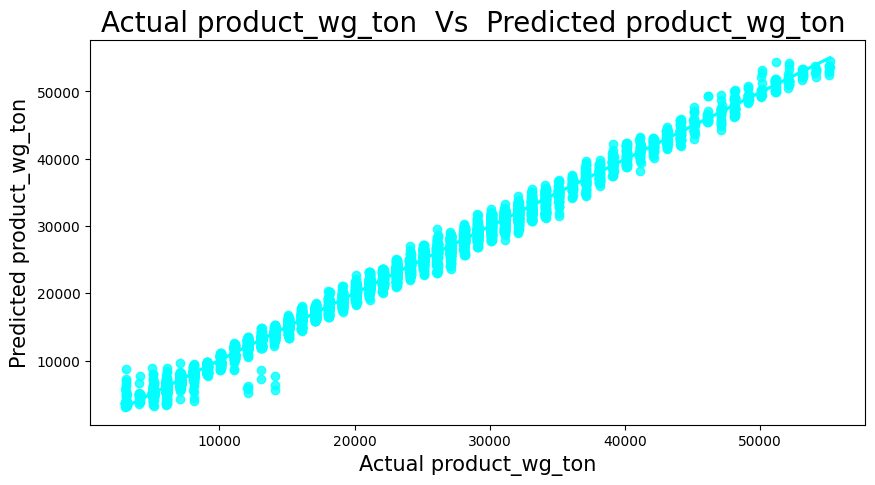

In [130]:
# Create a scatter plot with regression line

plt.figure(figsize=(10,5))
sns.regplot(x='product_wg_ton_actual',y='product_wg_ton_pred',data=result,color='cyan')

# Set plot labels and title

plt.title('Actual product_wg_ton  Vs  Predicted product_wg_ton ',fontsize=20)
plt.xlabel('Actual product_wg_ton',fontsize=15)
plt.ylabel('Predicted product_wg_ton',fontsize=15)

# Display the plot

plt.show()

Upon creating a plot that compares predictions against actual values, a remarkable observation emerges: a significant proportion of the predictions align remarkably closely with the actual values. This suggests that the predictive model is effectively capturing the underlying patterns within the data, resulting in accurate forecasts that closely resemble the true outcomes.

# Hyperparameter tunning

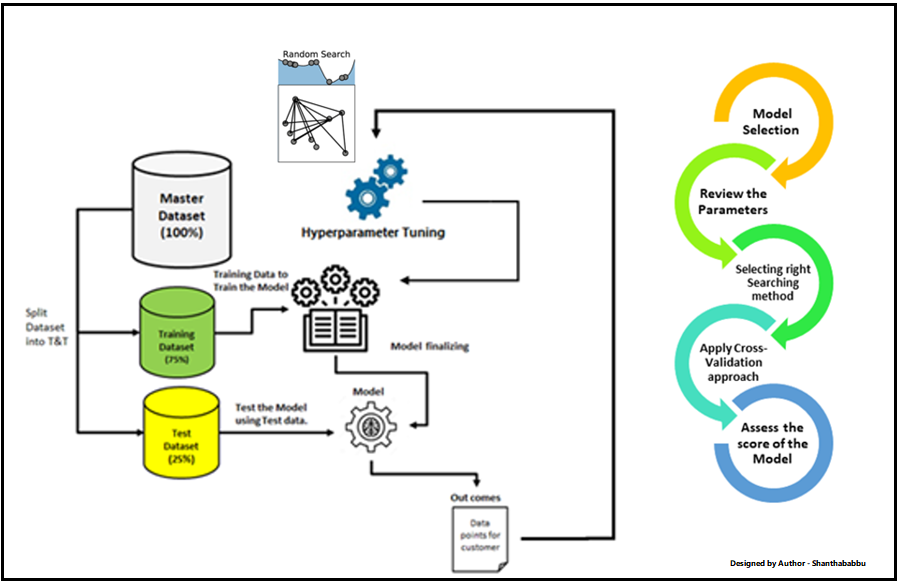

When utilizing the gradient-boosting algorithm, it's important to note that certain parameters are interdependent, preventing us from adjusting them in isolation. In this context, key parameters such as n_estimators, learning_rate, and the choice between max_depth and max_leaf_nodes are tightly interconnected. This means that modifying one parameter may influence the behavior or effectiveness of another. Therefore, a careful and holistic approach to parameter tuning is essential to achieve optimal performance with the gradient-boosting algorithm.


In [131]:
from scipy.stats import loguniform
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV

In [132]:
# Randomized Hyperparameter Search Results for Gradient Boosting Regressor

param_distributions = {
    "n_estimators": [1, 2, 5, 10, 20, 50, 100, 200, 500],
    "max_leaf_nodes": [2, 5, 10, 20, 50, 100],
    "learning_rate": loguniform(0.01, 1),
}
search_cv = RandomizedSearchCV(
    GradientBoostingRegressor(),
    param_distributions=param_distributions,
    scoring="neg_mean_absolute_error",
    n_iter=20,
    random_state=0,
    n_jobs=2,
)
search_cv.fit(x_train, y_train)

columns = [f"param_{name}" for name in param_distributions.keys()]
columns += ["mean_test_error", "std_test_error"]
cv_results = pd.DataFrame(search_cv.cv_results_)
cv_results["mean_test_error"] = -cv_results["mean_test_score"]
cv_results["std_test_error"] = cv_results["std_test_score"]
cv_results[columns].sort_values(by="mean_test_error")

,param_n_estimators,param_max_leaf_nodes,param_learning_rate,mean_test_error,std_test_error
1,200,20,0.160519,696.027464,7.606433
12,200,50,0.110585,696.368571,9.575586
10,200,20,0.109889,697.456719,8.457108
17,500,5,0.771785,756.416962,9.139849
6,500,100,0.709894,773.014444,8.995123
3,500,2,0.07502,823.870668,8.369826
18,10,5,0.637819,996.190803,16.918793
4,100,5,0.0351,1018.499293,14.632200
8,5,2,0.462636,2782.675802,28.552641
19,5,20,0.202432,3335.190436,48.222843


In [133]:
print("The best estimator returned by Randomsearchcv CV is:",search_cv.best_estimator_)

The best estimator returned by Randomsearchcv CV is: GradientBoostingRegressor(learning_rate=0.16051911333587626, max_leaf_nodes=20,
                          n_estimators=200)


In [134]:
GB=search_cv.best_estimator_
GB.fit(x_train,y_train)

GradientBoostingRegressor(learning_rate=0.16051911333587626, max_leaf_nodes=20,
                          n_estimators=200)

In [135]:
y_pred=GB.predict(x_test)

In [136]:
y_pred

array([16797.9530638 , 19524.27553946, 21738.94090633, ...,
       28437.280849  ,  6604.52256124, 19696.18359932])

In [137]:
# Model Performance Summary: Gradient Boosting Regressor

models=['GB']
result=pd.DataFrame({'Model_Name':models})
result['Adj_R_Square']=Results['Adj_R_Square']
result['Mean_Absolute_Error_MAE']=Results['Mean_Absolute_Error_MAE']
result['Root_Mean_Squared_Error_RMSE']=Results['Root_Mean_Squared_Error_RMSE']
result['Mean_Absolute_Percentage_Error_MAPE']=Results['Mean_Absolute_Percentage_Error_MAPE']
result['Mean_Squared_Error_MSE']=Results['Mean_Squared_Error_MSE']
result['Root_Mean_Squared_Log_Error_RMSLE']=Results['Root_Mean_Squared_Log_Error_RMSLE']
result['R2_score']=Results['R2_score']
result=result.sort_values(by='Adj_R_Square',ascending=False).reset_index(drop=True)
result

,Model_Name,Adj_R_Square,Mean_Absolute_Error_MAE,Root_Mean_Squared_Error_RMSE,Mean_Absolute_Percentage_Error_MAPE,Mean_Squared_Error_MSE,Root_Mean_Squared_Log_Error_RMSLE,R2_score
0,GB,0.986521,998.823115,1359.920994,7.28302,1.849385e+06,7.215182,0.986537


Amidst the chorus of various models vying for attention—'LinearRegression,' 'DecisionTreeRegressor,' 'RandomForestRegressor,' 'KNeighborsRegressor,' 'ExtraTreesRegressor,' 'XGBRegressor,' 'BaggingRegressor,' 'Ridge Regression,' and 'Lasso Regression'—we crowned the Gradient Boosting Regressor as our project's crowning glory.


In this artistic endeavor, our palette was composed of diverse accuracy metrics, each adding its hue to the canvas. The ensemble included the Adj_R_Square, Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), Mean Absolute Percentage Error (MAPE), Mean Squared Error (MSE), Root Mean Squared Log Error (RMSLE), and the cherished R2_score.


In this grand exposition, the spotlight eventually fell on the Adjusted R-squared metric, illuminating the path forward. Behold, the Gradient Boosting Regressor emerged as the chosen one, boasting an adjusted R-squared of 0.986521 after undergoing the transformative touch of hyperparameter tuning.


An ode to precision, a testament to elegance—our project's journey culminates in the sublime Gradient Boosting Regressor, embraced by the tender embrace of metrics and artistry.


Based on the analysis and evaluation of the regression models, I would draw the following conclusions and provide recommendations to address the supply chain challenges in the instant noodles business :

# Conclusion:

In the symphony of supply chain management, data orchestration plays a pivotal role. As we embarked on this data-driven odyssey, we encountered a dataset that held the secrets of warehouse operations, transportation, and sales. Our journey through the project's steps illuminated the path toward informed decision-making and operational excellence.

Exploring the data, we delved deep into its nuances. With **Pandas Profiling**, we unraveled missing values, scrutinized distribution patterns, and painted a vivid picture of our dataset. The enchanting scatterplots unveiled relationships between variables, and the seaborn count plots revealed the distribution of categorical variables across different zones, types, and certifications. As we conducted correlation analysis, the heat map spoke volumes, **showcasing how the storage reported during the last three months influenced sales shipment.**

With our analytical compass steady, we navigated through model selection, guided by a plethora of performance metrics. In the end, the Gradient Boosting Regressor emerged victorious, its **Adjusted R-squared of 0.986521** shimmering as a testament to its accuracy.




# Recommendations:

**1. Strategic Warehouse Placement:** The analysis highlighted that most warehouses are situated in rural areas and the North zone. Leveraging this insight, supply chain managers can strategically allocate resources and streamline operations in these regions.

**2. Storage Reporting Optimization:** The strong positive correlation between storage reported during the last three months and product shipment underscores the importance of timely and accurate storage reporting. Implementing efficient reporting mechanisms can lead to improved sales outcomes.

**3. Government Certification Focus:** As a significant number of warehouses possess government-approved certificates of 'C' type, focusing on obtaining and maintaining such certifications can enhance credibility and trustworthiness.

**4. Enhanced Predictive Modeling:** By embracing the Gradient Boosting Regressor model with hyperparameter tuning, supply chain managers can harness its predictive prowess to optimize sales and inventory management.


As we conclude this journey, we stand at the threshold of empowered supply chain decision-making. Armed with insights, correlations, and predictive models, the future holds promise—a future where efficiency, accuracy, and profitability harmoniously intertwine.






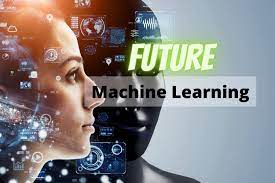